In bovenstaande simulatie hebben de twee zuigers een tegengestelde beweging. Maak nu een nieuwe simulatie, waarbij de twee zuigers in dezelfde richting bewegen. Dan verandert het oppervlak van het volume dus niet. (Dit kan in een nieuw werkblad, als je dat fijner vindt)

- Meet de temperatuur van het gas als functie van de verplaatsing van de zuigers. Beweeg de zuigers minimaal over de halve lengte van het volume. 
- Varieer de snelheid van de zuigers en de starttemperatuur van het gas en onderzoek de resultaten.
- Verklaar het gedrag. Doe dit zowel op een microscopisch niveau (met stuiterende balletjes met een impuls en een energie) als op een macroscopisch niveau (met druk, volume en temperatuur)


In [3]:
# ruimte voor uitwerking

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.optimize import curve_fit

BOX_SIZE_0 = 10                 # Hoogte en breedte startvolume in nm
N = 40                          # Aantal deeltjes
V_0 = 410                       # Startsnelheid van deeltjes in nm/ns
RADIUS = 0.3                    # Straal van moleculen in nm
DT = 7.5e-5                     # Tijdstap om geen botsing te missen in ns
V_PISTON_0 = V_0         # Startsnelheid van zuiger 
# (negatief betekent zowel links als rechts naar binnen gericht)

class ParticleClass:
    def __init__(self, m, v, r, R):
        """ maakt een deeltje (constructor) """
        self.m = m                         
        self.v = np.array(v, dtype=float)  
        self.r = np.array(r, dtype=float)  
        self.R = R

    def update_position(self):
        """ verandert positie voor één tijdstap """
        self.r += self.v * DT 
            
    @property
    def momentum(self):
        return self.m * self.v
    
    @property
    def kin_energy(self):
        return 1/2 * self.m * np.dot(self.v, self.v)
    
def collide_detection(p1: ParticleClass, p2: ParticleClass) -> bool:
    """ Geeft TRUE als de deeltjes overlappen """
    dx = p1.r[0]-p2.r[0]
    dy = p1.r[1]-p2.r[1]
    rr = p1.R + p2.R
    return  dx**2+dy**2 < rr**2 

def particle_collision(p1: ParticleClass, p2: ParticleClass):
    """ past snelheden aan uitgaande van overlap """
    m1, m2 = p1.m, p2.m
    delta_r = p1.r - p2.r
    delta_v = p1.v - p2.v
    dot_product = np.dot(delta_r, delta_v)
    # Als deeltjes van elkaar weg bewegen dan geen botsing
    if dot_product >= 0: # '='-teken voorkomt ook problemen als delta_r == \vec{0}
        return
    distance_squared = np.dot(delta_r, delta_r) 
    # Botsing oplossen volgens elastische botsing in 2D
    p1.v -= 2 * m2 / (m1 + m2) * dot_product / distance_squared * delta_r
    p2.v += 2 * m1 / (m1 + m2) * dot_product / distance_squared * delta_r

In [23]:
box_height = BOX_SIZE_0     # hoogte van beheersvolume
box_length = BOX_SIZE_0     # breedte van beheersvolume
box_center_x = 0.0          # Midden van de box
impulse_outward = 0.0       # totale stoot van deeltjes naar buiten gericht
pressure = 0.0              # druk in beheersvolume
v_piston = V_PISTON_0       # huidige snelheid van zuiger
if 1: v_piston*=1          # If 1: Move right, if 0: Move left


work = 0.0                  # arbeid uitgevoerd door gas


In [5]:
def top_down_collision(particle: ParticleClass):
    """ botsingen met wanden onder en boven controleren en totale stoot bepalen """
    global impulse_outward, box_height
    if abs(particle.r[1]) + particle.R > box_height / 2:
        particle.r[1] = np.sign(particle.r[1]) * (box_height/2 - particle.R)
        impulse_outward += abs(particle.momentum[1]) * 2
        particle.v[1] *= -1
    
def left_right_collision(particle: ParticleClass):
    """ verzorgen van botsingen met wand links en rechts, die als zuiger kunnen bewegen """
    global box_length, v_piston, impulse_outward, work, box_center_x

    wall_right = box_center_x + box_length/2
    wall_left = box_center_x - box_length/2

    if particle.r[0] + particle.R > wall_right:     # Hits the RIGHT wall
        particle.r[0] = wall_right - particle.R
        piston_velocity = v_piston # If piston to the right, 
        relative_velocity = particle.v[0] - piston_velocity
        particle.v[0] = -relative_velocity + piston_velocity
        impulse_outward += 2 * particle.m * abs(relative_velocity)
        work += 2 * particle.m * relative_velocity * piston_velocity

    elif particle.r[0] - particle.R < wall_left:     # Hits the LEFT wall
        particle.r[0] = wall_left + particle.R
        piston_velocity = v_piston # If piston to the right, 
        relative_velocity = particle.v[0] - piston_velocity
        particle.v[0] = -relative_velocity + piston_velocity
        impulse_outward += 2 * particle.m * abs(relative_velocity)
        work += 2 * particle.m * relative_velocity * piston_velocity


In [36]:
def create_particles(particles):
    """ Leegmaken en opnieuw aanmaken van deeltjes  in lijst """
    global box_length, box_height
    particles.clear()
    for _ in range(N):
        vx = np.random.uniform(-V_0, V_0)
        vy = np.random.choice([-1, 1]) * np.sqrt(V_0**2 - vx**2)        
        x = np.random.uniform(-box_length/2 + RADIUS, box_length/2 - RADIUS)
        y = np.random.uniform(-box_height/2 + RADIUS, box_height/2 - RADIUS)
        particles.append(ParticleClass(m=1.0, v=[vx, vy], r=[x, y], R=RADIUS))
            
def handle_collisions(particles):
    """ alle onderlinge botsingen afhandelen voor deeltjes in lijst """
    num_particles = len(particles)
    for i in range(num_particles):
        for j in range(i+1, num_particles):
            if collide_detection(particles[i], particles[j]):
                particle_collision(particles[i], particles[j])

def handle_walls(particles):
    """ botsing met wanden controleren voor alle deeltjes in lijst en gemiddeld bepaling druk """
    global pressure, impulse_outward, box_height, box_length   # om pressure buiten de functie te kunnen gebruiken
    impulse_outward = 0.0
    for p in particles:
        left_right_collision(p)
        top_down_collision(p)    
    pressure = 0.95 * pressure + 0.05 * impulse_outward / ((2 * box_length + 2 * box_height) * DT) 

def take_time_step(particles):
    """ zet tijdstap voor een lijst deeltjes en verwerk alle botsingen onderling en met wanden """
    global box_center_x, v_piston
    box_center_x += v_piston*DT

    for p in particles:
        p.update_position()
    handle_collisions(particles)
    handle_walls(particles)  

k_B = 1.38e-23      # Constante van Boltzmann J/K
f_grad = 2          # Twee dimensies
m_gas = 4.65e-26    # mass of a molecule
def temperature(particles) -> float:
    particle_velocities = np.array([p.v for p in particles])        # Make an array of all velocity values of all particles
    #particle_velocities[:, 0] -= v_piston
    velocities_squared = np.sum(particle_velocities**2, axis=1)     # Square this array
    velocities_sqared_avg = np.mean(velocities_squared)             # Calculate the average

    temp = (m_gas*velocities_sqared_avg)/(f_grad*k_B)               # Apply temperature formula

    return temp



In [ ]:
def take_time_step(particles):
    """ zet tijdstap voor een lijst deeltjes en verwerk alle botsingen onderling en met wanden """
    global box_center_x, v_piston
    box_center_x += v_piston * DT 
    for p in particles:
        p.update_position()
    handle_walls(particles)  
    handle_collisions(particles)

def update(frame):
    global box_center_x
    take_time_step(particles)

    wall_right = box_center_x + box_length/2
    wall_left = box_center_x - box_length/2

    dot.set_data([p.r[0] for p in particles], [p.r[1] for p in particles])
    ax.set_xlim(wall_left, wall_right)
    return dot,


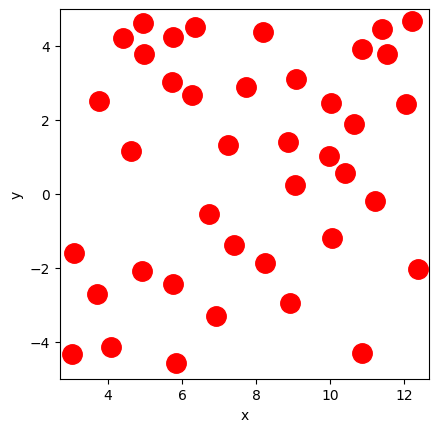

In [39]:
# Deel van de animated simulatie
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots()
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_xlim(-BOX_SIZE_0/2, BOX_SIZE_0/2)
ax.set_ylim(-BOX_SIZE_0/2, BOX_SIZE_0/2)
ax.set_aspect('equal')
dot, = ax.plot([], [], 'ro', ms=14);

def init():
    dot.set_data([], [])
    return dot,


# we kiezen het aantal datapunten zodat het volume tot 1/3 van het begin volume reduceert
num_steps = 250

particles = []
box_center_x = 0

box_length = BOX_SIZE_0         # zetten zuiger terug
v_piston = V_PISTON_0
create_particles(particles)     # resetten deeltjes     

ani = FuncAnimation(fig, update, frames=int(num_steps), init_func=init, blit=True, interval=50)
HTML(ani.to_jshtml())


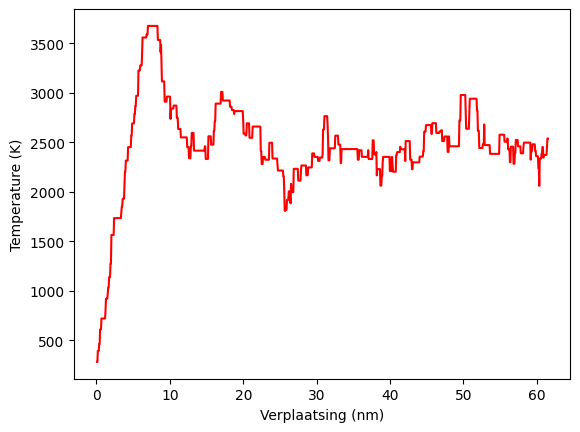

In [44]:
# Meet de temperatuur van het gas als functie van de verplaatsing van de zuigers. Beweeg de zuigers minimaal over de halve lengte van het volume. 

num_steps = 1000
BOX_SIZE_0 = 10                 # Hoogte en breedte startvolume in nm
N = 40                          # Aantal deeltjes


particles = []
temperatures = np.zeros(num_steps, dtype=float)
x_verplaatsing = np.zeros(num_steps, dtype=float)

box_length = BOX_SIZE_0         # zetten zuiger terug
box_center_x = 0
v_piston = 2*V_PISTON_0
create_particles(particles)     # resetten deeltjes 

for i in range(num_steps):
    take_time_step(particles)
    temperatures[i] = temperature(particles)
    x_verplaatsing[i] = box_center_x

plt.figure()
plt.xlabel(r'Verplaatsing (nm)')
plt.ylabel('Temperature (K)')

plt.plot(x_verplaatsing, temperatures, '-r')

plt.show()

BOX_SIZE_0 = 10                 # Hoogte en breedte startvolume in nm
N = 40                          # Aantal deeltjes


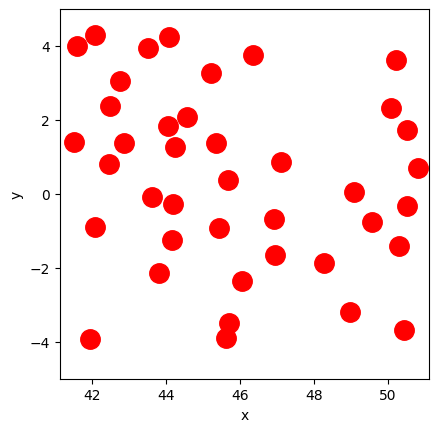

In [66]:
# Deel van de animated simulatie
fig, ax = plt.subplots()
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_xlim(-BOX_SIZE_0/2, BOX_SIZE_0/2)
ax.set_ylim(-BOX_SIZE_0/2, BOX_SIZE_0/2)
ax.set_aspect('equal')
dot, = ax.plot([], [], 'ro', ms=14);

def init():
    dot.set_data([], [])
    return dot,


# we kiezen het aantal datapunten zodat het volume tot 1/3 van het begin volume reduceert
num_steps = 250

particles = []
box_center_x = 0

box_length = BOX_SIZE_0         # zetten zuiger terug
v_piston = 6*V_PISTON_0
create_particles(particles)     # resetten deeltjes     

ani = FuncAnimation(fig, update, frames=int(num_steps), init_func=init, blit=True, interval=50)
HTML(ani.to_jshtml())


[  1.      5.125   9.25   13.375  17.5    21.625  25.75   29.875  34.
  38.125  42.25   46.375  50.5    54.625  58.75   62.875  67.     71.125
  75.25   79.375  83.5    87.625  91.75   95.875 100.   ]
Speed used: 0.1
Run done 1/25
Speed used: 0.22083333333333333
Run done 2/25
Speed used: 0.3416666666666667
Run done 3/25
Speed used: 0.4625
Run done 4/25
Speed used: 0.5833333333333334
Run done 5/25
Speed used: 0.7041666666666666
Run done 6/25
Speed used: 0.825
Run done 7/25
Speed used: 0.9458333333333333
Run done 8/25
Speed used: 1.0666666666666667
Run done 9/25
Speed used: 1.1875
Run done 10/25
Speed used: 1.3083333333333333
Run done 11/25
Speed used: 1.4291666666666667
Run done 12/25
Speed used: 1.55
Run done 13/25
Speed used: 1.6708333333333334
Run done 14/25
Speed used: 1.7916666666666667
Run done 15/25
Speed used: 1.9125
Run done 16/25
Speed used: 2.033333333333333
Run done 17/25
Speed used: 2.154166666666667
Run done 18/25
Speed used: 2.275
Run done 19/25
Speed used: 2.395833333333

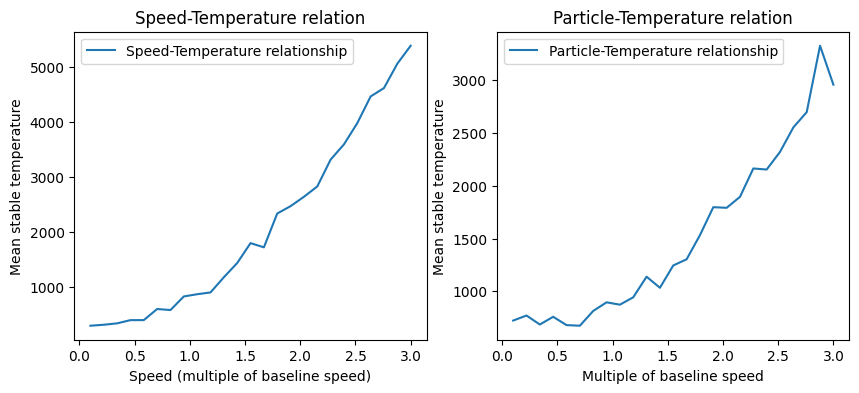

In [ ]:
# - Varieer de snelheid van de zuigers en de starttemperatuur van het gas en onderzoek de resultaten.
def run_simulation(steps, v0_particles, v0_piston):
    global v_piston, box_center_x, box_length, V_0
    V_0 = 410

    num_steps = steps
    v_piston = v0_piston*V_PISTON_0
    V_0*= v0_particles

    particles = []
    box_length = BOX_SIZE_0         # zetten zuiger terug
    box_center_x = 0
    create_particles(particles)     # resetten deeltjes 
    
    temperatures = np.zeros(num_steps, dtype=float)
    x_verplaatsing = np.zeros(num_steps, dtype=float)


    for i in range(num_steps):
        take_time_step(particles)
        temperatures[i] = temperature(particles)
        x_verplaatsing[i] = box_center_x

    return temperatures, x_verplaatsing

# Analyzeer temperatuur & beginsnelheid relatie.
N=40
total_runs = 25
steps_per_run = 500

start_speed = 0.1   # Multiple of V0
end_speed = 3       # Multiple of v0
speeds = np.linspace(start_speed, end_speed, total_runs)

start_particles = 1
end_particles = 100
particle_n = np.linspace(start_particles, end_particles, total_runs)
print(particle_n)

avg_temperature_bin_piston = np.zeros(total_runs, dtype=float)
avg_temperature_bin_particles = np.zeros(total_runs, dtype=float)

piston_speed_bin = np.zeros(total_runs, dtype=float)
particle_speed_bin = np.zeros(total_runs, dtype=float)

for run in range(total_runs):
    run_temperature, run_movement = run_simulation(steps_per_run, 1, speeds[run])
    avg_temperature_bin_piston[run] = np.mean(run_temperature[int(len(run_temperature)/2):])
    piston_speed_bin[run] = speeds[run]
    print(f'Speed used: {speeds[run]}')

    run_temperature, run_movement = run_simulation(steps_per_run, speeds[run], 1)
    avg_temperature_bin_particles[run] = np.mean(run_temperature[int(len(run_temperature)/2):])
    particle_speed_bin[run] = speeds[run]

    print(f'Run done {run+1}/{total_runs}')

#plt.figure()
#plt.plot(piston_speed_bin, avg_temperature_bin_speeds)
#plt.show()


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.plot(piston_speed_bin, avg_temperature_bin_piston, label='Speed-Temperature relationship', linestyle='-')

ax1.set_xlabel(r'Speed (multiple of baseline speed)')
ax1.set_ylabel(r'Mean stable temperature')
ax1.set_title(r'Piston speed-Temperature relation')
ax1.legend()

ax2.plot(particle_speed_bin, avg_temperature_bin_particles, label='Particle-Temperature relationship', linestyle='-')

ax2.set_xlabel(r'Multiple of baseline speed')
ax2.set_ylabel(r'Mean stable temperature')
ax2.set_title(r'Particle speed-Temperature relation')
ax2.legend()

plt.show()


- Verklaar het gedrag. Doe dit zowel op een microscopisch niveau (met stuiterende balletjes met een impuls en een energie) als op een macroscopisch niveau (met druk, volume en temperatuur)

Microscopish niveau:
De deeltjes beginnen met een willekeurige snelheid. Wanneer een deeltje wordt aangeraakt door de bewegende wand vind er een grote snelheidsverandering plaats. Naarmate de piston-snelheid snller wordt, neemt de kinetische energie toe. Aangezien de Kinetische energie een kwadratische functie is, neemt de temperatuur kwadratisch toe.

Macroscopisch niveau:
De bewegende doos verricht arbeid op het stilstaande gas. 
dU = Q + W. 
Bij het "opstarten" van de beweging geld er dan dus een toename van interne energie gelijk aan de arbeid (met Q=0, adiabatisch process). Deze interne energie is direct gekoppeld aan de temperatuur, wat daardoor dus stijgt. 